<a href="https://colab.research.google.com/github/PinKevin/Tubes-ML/blob/main/Tubes_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup Kaggle


In [2]:
!pip install -q kaggle

In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"emeriokevin","key":"24bafa299f116eba2bd84b2832b16c5b"}'}

In [4]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [5]:
!chmod 600 ~/.kaggle/kaggle.json

In [11]:
!kaggle datasets download -d iammustafatz/diabetes-prediction-dataset

  0% 0.00/734k [00:00<?, ?B/s]
100% 734k/734k [00:00<00:00, 80.8MB/s]


In [12]:
!mkdir train

In [13]:
!unzip diabetes-prediction-dataset.zip -d train

Archive:  diabetes-prediction-dataset.zip
  inflating: train/diabetes_prediction_dataset.csv  


# Buat model Tree

Impor modul

In [14]:
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

Loading data

In [145]:
diabetes = pd.read_csv('./train/diabetes_prediction_dataset.csv')
diabetes.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0


Ubah kolom

In [146]:
diabetes['is_male'] = diabetes['gender'].replace('Male', 1).replace('Female', 0).replace('Other', 2)
diabetes['is_smoking'] = diabetes['smoking_history'].replace('No Info', 0).replace('never', 1).replace('former', 2).replace('ever', 3).replace('current', 4).replace('not current', 5)
diabetes.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes,is_male,is_smoking
0,Female,80.0,0,1,never,25.19,6.6,140,0,0,1
1,Female,54.0,0,0,No Info,27.32,6.6,80,0,0,0
2,Male,28.0,0,0,never,27.32,5.7,158,0,1,1
3,Female,36.0,0,0,current,23.45,5.0,155,0,0,4
4,Male,76.0,1,1,current,20.14,4.8,155,0,1,4


Feature Selection

In [147]:
data_n = 10000
diabetes = diabetes.sample(n=data_n, random_state=1)
feature_cols = ['age', 'HbA1c_level', 'blood_glucose_level', 'heart_disease', 'is_male']
X = diabetes[feature_cols]
y = diabetes['diabetes']
print(X.shape)
X.head()

(10000, 5)


,age,HbA1c_level,blood_glucose_level,heart_disease,is_male
43660,73.0,5.0,155,0,0
87278,35.0,4.5,130,0,0
14317,38.0,6.2,130,0,1
81932,75.0,6.2,159,0,0
95321,51.0,6.2,240,0,0


Split Data

In [148]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

Decision Tree Model

In [41]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)


Evaluate the Model

In [34]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.9666666666666667


# Visualizing the Tree

Impor

In [24]:
!pip install graphviz pydotplus

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.188048 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.188048 to fit



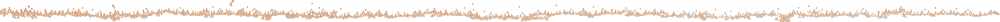

In [26]:
# from sklearn.tree import export_graphviz
# from six import StringIO
# from IPython.display import Image
# import pydotplus

# dot_data = StringIO()
# export_graphviz(clf, out_file=dot_data,
#                 filled=True, rounded=True,
#                 special_characters=True,feature_names = feature_cols,class_names=['0','1'])
# graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
# graph.write_png('diabetes.png')
# Image(graph.create_png())


In [149]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=30)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.9526666666666667


In [115]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('diabetes.png')
Image(graph.create_png())


# COBA 2

Impor Data

In [182]:
diabetes = pd.read_csv('./train/diabetes_prediction_dataset.csv')
diabetes.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0


Preprocessing

Ubah data gender dan smoking ke numerik

In [183]:
smoking_history_dict = {'never':0, 'former':1, 'current':2}

diabetes['smoking_history'] = diabetes.smoking_history.map(smoking_history_dict)

In [184]:
gender_dict = {'Female':0, 'Male':1}

diabetes['gender'] = diabetes.gender.map(gender_dict)

In [185]:
diabetes.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0.0,80.0,0,1,0.0,25.19,6.6,140,0
1,0.0,54.0,0,0,NaN,27.32,6.6,80,0
2,1.0,28.0,0,0,0.0,27.32,5.7,158,0
3,0.0,36.0,0,0,2.0,23.45,5.0,155,0
4,1.0,76.0,1,1,2.0,20.14,4.8,155,0


Hapus data NULL

In [186]:
diabetes.isnull().sum()

gender                    18
age                        0
hypertension               0
heart_disease              0
smoking_history        46267
bmi                        0
HbA1c_level                0
blood_glucose_level        0
diabetes                   0
dtype: int64

In [187]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')

diabetes = imputer.fit_transform(diabetes)

diabetes

array([[  0. ,  80. ,   0. , ...,   6.6, 140. ,   0. ],
       [  0. ,  54. ,   0. , ...,   6.6,  80. ,   0. ],
       [  1. ,  28. ,   0. , ...,   5.7, 158. ,   0. ],
       ...,
       [  1. ,  66. ,   0. , ...,   5.7, 155. ,   0. ],
       [  0. ,  24. ,   0. , ...,   4. , 100. ,   0. ],
       [  0. ,  57. ,   0. , ...,   6.6,  90. ,   0. ]])

In [188]:
diabetes = pd.DataFrame(diabetes, columns=['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'])

In [189]:
#scaling the data for higher accuracy
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
diabetes = scaler.fit_transform(diabetes)

In [190]:
diabetes = pd.DataFrame(diabetes, columns=['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'])

In [191]:
print(diabetes.shape)
diabetes.head()

(100000, 9)


,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0.0,1.000000,0.0,1.0,0.00000,0.177171,0.563636,0.272727,0.0
1,0.0,0.674675,0.0,0.0,0.25984,0.202031,0.563636,0.000000,0.0
2,1.0,0.349349,0.0,0.0,0.00000,0.202031,0.400000,0.354545,0.0
3,0.0,0.449449,0.0,0.0,1.00000,0.156863,0.272727,0.340909,0.0
4,1.0,0.949950,1.0,1.0,1.00000,0.118231,0.236364,0.340909,0.0


In [195]:
#spliiting the data into training and test data
from sklearn.model_selection import train_test_split

X = diabetes[diabetes.columns[2:8]]
y = diabetes['diabetes']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

Decision Tree

In [206]:
#training the data using Decision Trees
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(criterion = 'entropy', max_depth = 10, random_state = 0)

clf.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=0)

In [207]:
#predicting the values on test data
y_preds = clf.predict(X_test)

In [208]:
#checking the accuracy of our model
from sklearn.metrics import accuracy_score

accuracy_score(y_test, y_preds)

0.97215

In [209]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_test, y_preds)

array([[18286,     6],
       [  551,  1157]])

[Text(0.4651442307692308, 0.9545454545454546, 'x[4] <= 0.582\nentropy = 0.419\nsamples = 80000\nvalue = [73208, 6792]'),
 Text(0.45552884615384615, 0.8636363636363636, 'x[5] <= 0.591\nentropy = 0.278\nsamples = 76893\nvalue = [73208, 3685]'),
 Text(0.44591346153846156, 0.7727272727272727, 'x[4] <= 0.336\nentropy = 0.194\nsamples = 75464\nvalue = [73208, 2256]'),
 Text(0.4362980769230769, 0.6818181818181818, 'entropy = 0.0\nsamples = 30373\nvalue = [30373, 0]'),
 Text(0.45552884615384615, 0.6818181818181818, 'x[5] <= 0.15\nentropy = 0.287\nsamples = 45091\nvalue = [42835, 2256]'),
 Text(0.44591346153846156, 0.5909090909090909, 'entropy = 0.0\nsamples = 13229\nvalue = [13229, 0]'),
 Text(0.4651442307692308, 0.5909090909090909, 'x[3] <= 0.212\nentropy = 0.369\nsamples = 31862\nvalue = [29606, 2256]'),
 Text(0.2247596153846154, 0.5, 'x[0] <= 0.5\nentropy = 0.253\nsamples = 22365\nvalue = [21420, 945]'),
 Text(0.12980769230769232, 0.4090909090909091, 'x[1] <= 0.5\nentropy = 0.219\nsamples =

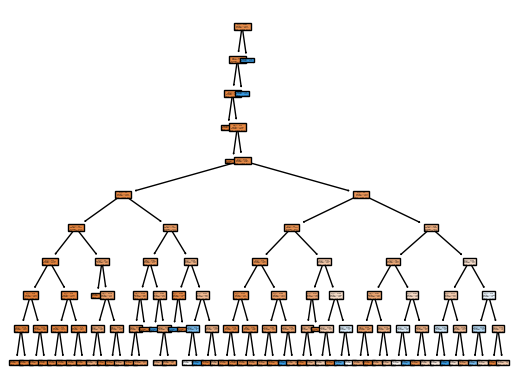

In [210]:
#visualizing the decision tree
from sklearn import tree

tree.plot_tree(clf.fit(X_train, y_train), filled='True')